# ASTR310 Project 1: Investigating HII Regions (Especially NGC604) in M33 through Halpha and OIII Filters with the 7-in. Refractor 

This jupyter notebook is mainly for testing/playing with aperture photometry. Final, clean results will be from main.py.

In [1]:
# Import modules
import calibration
import photometry
import stacking
import align
import dataReduce
from align import dispFITS
import calibration as calib
import aperE
import size

# Additional Imports
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndimage
import pandas as pd

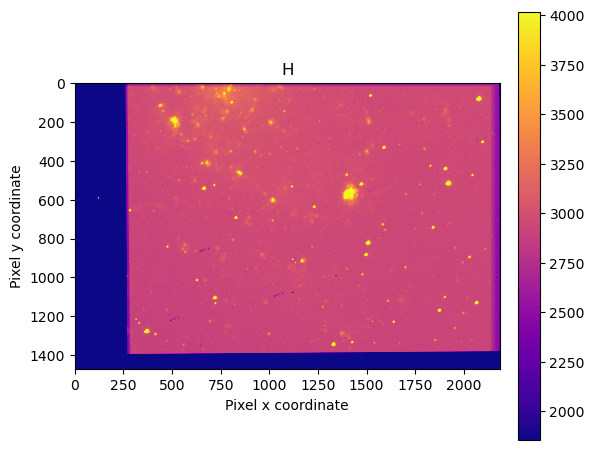

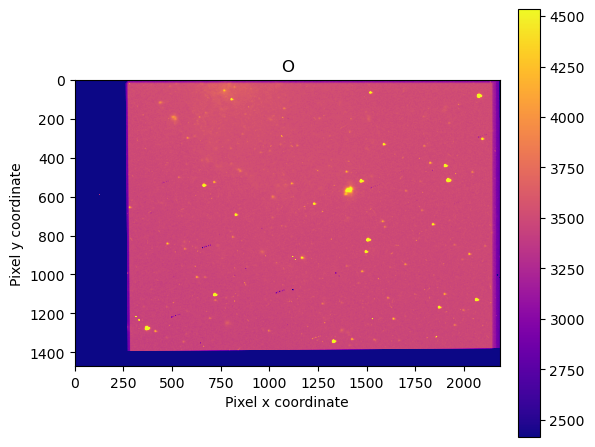

In [2]:
H = fits.open("H.fit")[0]
O = fits.open("O.fit")[0]
dispFITS(H,1,1,"H")
dispFITS(O,1,1,"O")

In [3]:
coordsH = [[1408,572,0]]
coordsO = [[1406,570,0]]

In [4]:
# May end up not using
df = pd.DataFrame(columns=['Target Aperature Rad1 [Pix]', 'Target Aperature Rad2 [Pix]', \
                           'Inner Sky Annulus IR1 [Pix]', 'Inner Sky Annulus IR2 [Pix]', \
                           'Outer Sky Annulus OR1 [Pix]', 'Outer Sky Annulus OR2 [Pix]', \
                           'X [Pix]', 'Y [Pix]', 'Angle [Radians]', \
                           'Flux [Electrons]', 'Flux Uncertainty [Electrons]'])

5763726.395122678 114930.33388179733


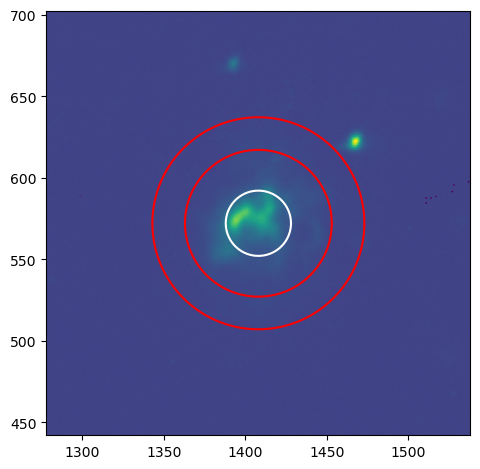

In [5]:
aperture = (20, 20, 45, 45, 65, 65)
egain = 1.2999999523162842
Kccd = 1/egain

rad1 = aperture[0]
rad2 = aperture[1]
ir1 = aperture[2]
ir2 = aperture[3]
or1 = aperture[4]
or2 = aperture[5]

flux, err = aperE.aperE(H.data, coordsH[0][0], coordsH[0][1], rad1, rad2, ir1, ir2, or2, or2, Kccd)
print(flux, err)

/Users/bnowicki/Documents/ASTR310/ASTR310_P1/aperE.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


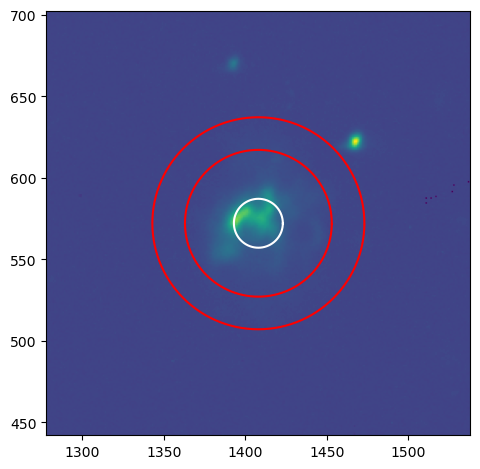

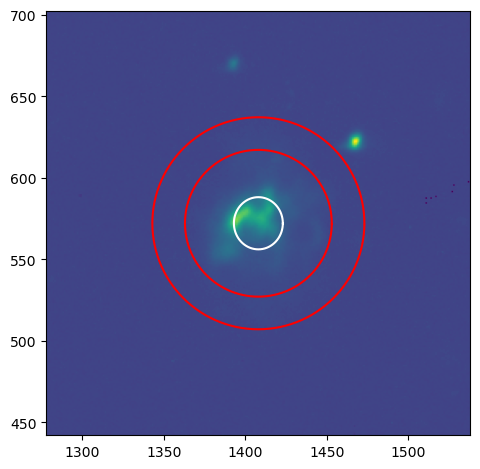

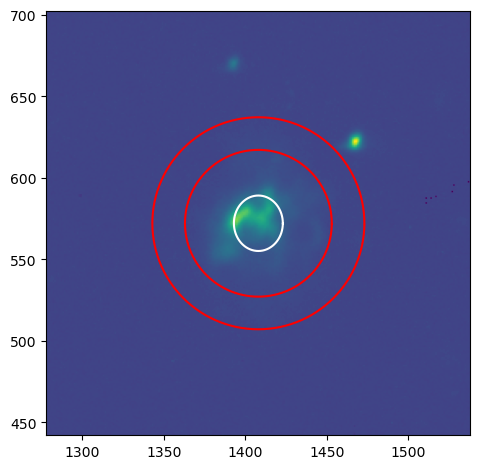

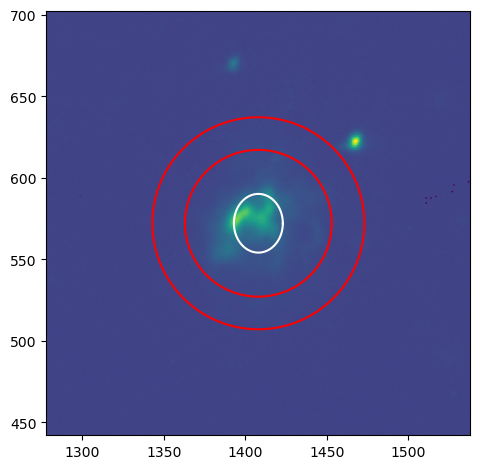

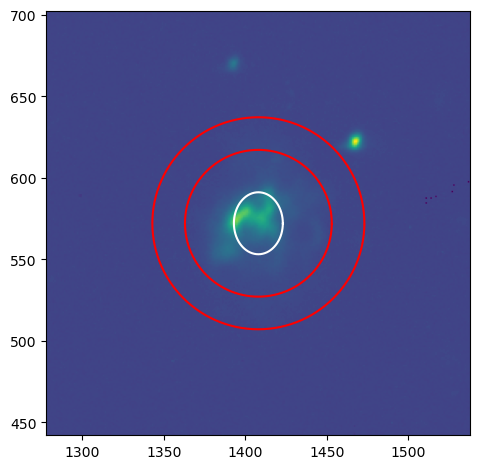

...

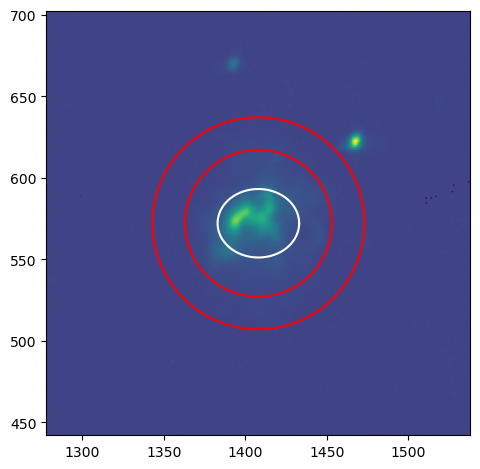

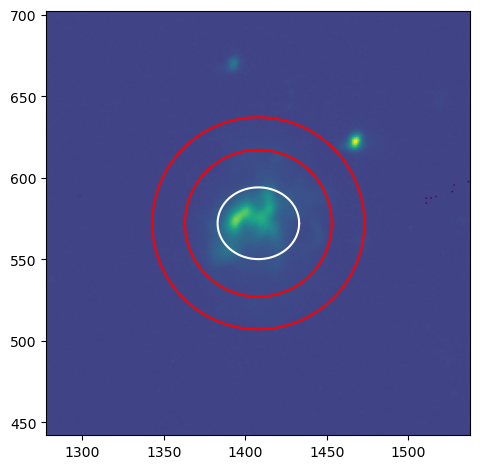

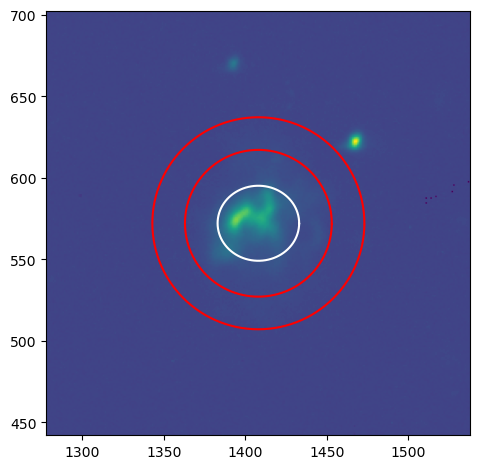

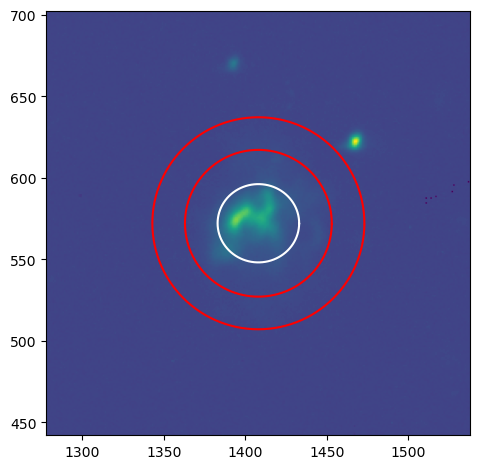

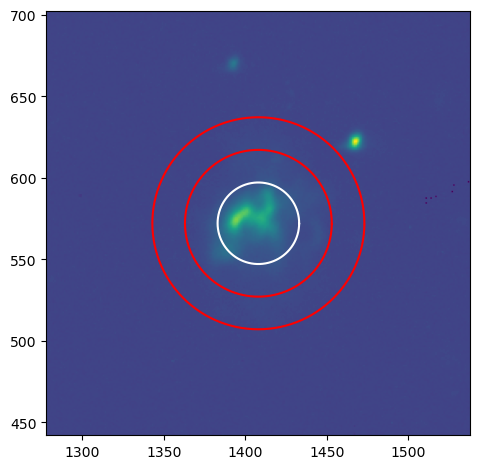

In [3]:
coordsH = [[1408,572,0]]
coordsO = [[1406,570,0]]

base_aperture = (20, 20, 45, 45, 65, 65)
coords, apertures, flux_arr, err_arr = photometry.aperE_driver(H, coordsH[0], base_aperture, 5, 5, 1)

In [7]:
print(max(flux_arr))
print(np.argmax(flux_arr))
print(apertures[99])
print(flux_arr[99])
print(err_arr[99])
print(len(flux_arr))

7033570.613358037
120
(24, 15, 45, 45, 65, 65)
5369537.509676866
103826.22640480576
121


In [10]:
print(np.reshape(apertures, (11, 11, 6)))

[[[15 15 45 45 65 65]
  [15 16 45 45 65 65]
  [15 17 45 45 65 65]
  [15 18 45 45 65 65]
  [15 19 45 45 65 65]
  [15 20 45 45 65 65]
  [15 21 45 45 65 65]
  [15 22 45 45 65 65]
  [15 23 45 45 65 65]
  [15 24 45 45 65 65]
  [15 25 45 45 65 65]]

 [[16 15 45 45 65 65]
  [16 16 45 45 65 65]
  [16 17 45 45 65 65]
  [16 18 45 45 65 65]
  [16 19 45 45 65 65]
  [16 20 45 45 65 65]
  [16 21 45 45 65 65]
  [16 22 45 45 65 65]
  [16 23 45 45 65 65]
  [16 24 45 45 65 65]
  [16 25 45 45 65 65]]

 [[17 15 45 45 65 65]
  [17 16 45 45 65 65]
  [17 17 45 45 65 65]
  [17 18 45 45 65 65]
  [17 19 45 45 65 65]
  [17 20 45 45 65 65]
  [17 21 45 45 65 65]
  [17 22 45 45 65 65]
  [17 23 45 45 65 65]
  [17 24 45 45 65 65]
  [17 25 45 45 65 65]]

 [[18 15 45 45 65 65]
  [18 16 45 45 65 65]
  [18 17 45 45 65 65]
  [18 18 45 45 65 65]
  [18 19 45 45 65 65]
  [18 20 45 45 65 65]
  [18 21 45 45 65 65]
  [18 22 45 45 65 65]
  [18 23 45 45 65 65]
  [18 24 45 45 65 65]
  [18 25 45 45 65 65]]

 [[19 15 45 45 65 65]
  

In [15]:
print(np.reshape(flux_arr, (11, 11)))

[[3977780.02814752 4082720.6237427  4275738.37762019 4383467.35922601
  4522846.48810166 4643415.78645531 4751597.99931675 4845449.14812395
  4957858.59440896 5029535.72905129 5110192.03087534]
 [4162085.67532511 4341086.63819679 4508215.56159832 4655452.46955898
  4791677.48241539 4893743.1989992  5035273.84791971 5125632.8354263
  5237114.00689997 5303441.25791106 5399681.13390035]
 [4417056.47577462 4576548.04081728 4726679.31010621 4884148.34117469
  5024733.51318343 5158165.7545061  5270810.83372452 5392111.64224169
  5475233.514393   5580175.61015942 5669285.19083924]
 [4575622.00676392 4774597.88192751 4934308.59104019 5084877.93993349
  5248015.07745828 5368088.40214267 5494293.98978399 5631218.70871864
  5716984.60810446 5798333.37935    5896538.70266035]
 [4758975.14703059 4952000.54873308 5120113.36006229 5289298.08254939
  5436889.84050685 5571432.67125242 5705678.46778141 5811186.48948279
  5924778.02950317 6015043.58032989 6126580.29789402]
 [4909441.69078824 5083706.6082

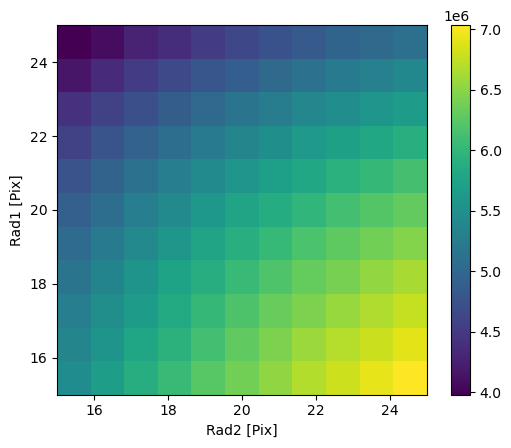

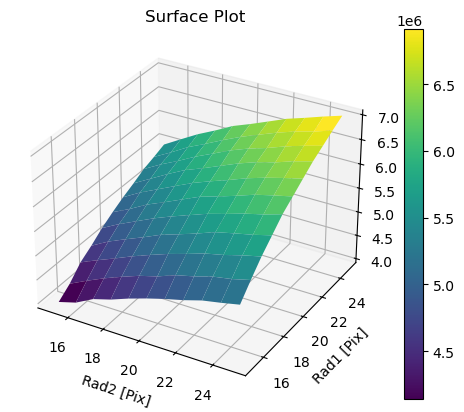

In [6]:
photometry.surface_plot(flux_arr, base_aperture, 5, 5, 1, type=0)
photometry.surface_plot(flux_arr, base_aperture, 5, 5, 1, type=1)
plt.show()

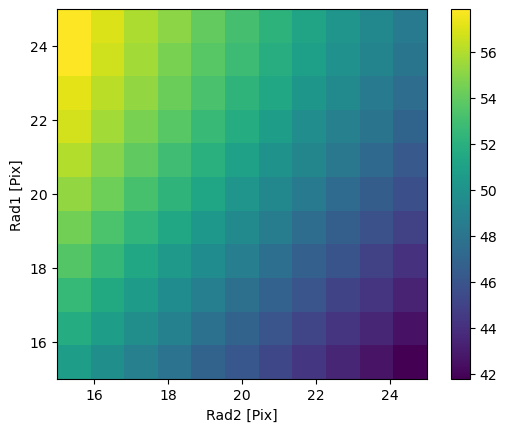

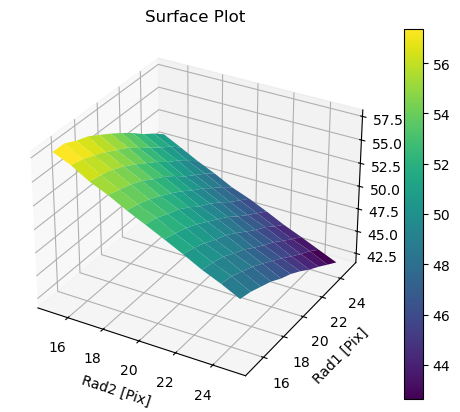

In [13]:
# SNR
photometry.surface_plot(np.array(flux_arr)/np.array(err_arr), base_aperture, 5, 5, 1, type=0)
photometry.surface_plot(np.array(flux_arr)/np.array(err_arr), base_aperture, 5, 5, 1, type=1)
plt.show()